# Load the data

In [2]:
# Import necessary packages
using DrWatson
using JLD2

# Activate the project environment
@quickactivate :FlowComplexity

# Define the file path
file_path = joinpath("./data/sims/000100", "simulation.jld2")

# Load the data from the specified file
@load file_path sim

1-element Vector{Symbol}:
 :sim

In [3]:
using CSV, DataFrames

graph_df = CSV.read("./data/sims/000100/graph.csv", DataFrame)

Row,destinations,source_inflow,sources
,Int64,Bool,Int64
1,2,true,1
2,4,true,1
3,3,false,2
4,5,false,2
5,6,false,3
6,5,false,4
7,7,false,4
8,6,false,5
9,8,false,5


In [4]:
using Graphs
using DataFrames

# Function to reconstruct a graph from edge lists
function reconstruct_graph(sources::Vector{Int}, destinations::Vector{Int})
    # Ensure the sources and destinations vectors have the same length
    if length(sources) != length(destinations)
        throw(ArgumentError("Sources and destinations must have the same length"))
    end

    # Find the number of unique nodes
    nodes = unique(vcat(sources, destinations))
    num_nodes = maximum(nodes)

    # Create an empty graph with the required number of nodes
    g = SimpleDiGraph(num_nodes)

    # Add edges to the graph
    for (src, dest) in zip(sources, destinations)
        add_edge!(g, src, dest)
    end

    return g
end

# Example usage
# sources = [1, 2, 3, 4]
sources = graph_df[:, "sources"]
# destinations = [2, 3, 4, 1]
destinations = graph_df[:, "destinations"]

graph = reconstruct_graph(sources, destinations)

# Print the graph
println(graph)

SimpleDiGraph{Int64}(12, [[2, 4], [3, 5], [6], [5, 7], [6, 8], [9], [8], [9], Int64[]], [Int64[], [1], [2], [1], [2, 4], [3, 5], [4], [5, 7], [6, 8]])


In [8]:
import Pkg; Pkg.add("GraphPlot")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed IterTools ─ v1.10.0
   Installed Compose ─── v0.9.5
   Installed GraphPlot ─ v0.6.0
    Updating `~/Documents/academic/3-research/projects/2023 spatial-topology/flow-complexity/Project.toml`
  [a2cc645c] + GraphPlot v0.6.0
    Updating `~/Documents/academic/3-research/projects/2023 spatial-topology/flow-complexity/Manifest.toml`
  [a81c6b42] + Compose v0.9.5
  [a2cc645c] + GraphPlot v0.6.0
  [c8e1da08] + IterTools v1.10.0
Precompiling project...
  ✓ IterTools
  ✓ Compose
  ✓ GraphPlot
  3 dependencies successfully precompiled in 4 seconds. 224 already precompiled.


In [10]:
import Pkg; Pkg.add("Colors")

   Resolving package versions...
    Updating `~/Documents/academic/3-research/projects/2023 spatial-topology/flow-complexity/Project.toml`
  [5ae59095] + Colors v0.12.11
  No Changes to `~/Documents/academic/3-research/projects/2023 spatial-topology/flow-complexity/Manifest.toml`


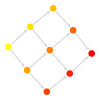

In [5]:
using Graphs
using GraphPlot
using Colors

# Plot the graph
gplot(graph, nodefillc=range(colorant"yellow", stop=colorant"red", length=nv(graph)))

on veut la moyenne du assembly index (ou juste des integers) pour chacun des chemostats, en fonction de la distance from source

# load the AI CSV

In [147]:
using CSV
using DataFrames

# Specify the path to the CSV file
file_path = "./data/Assembly-10000.csv"

# Read the CSV file into a DataFrame
AI_df = CSV.read(file_path, DataFrame) ;

# plot of AI(I)

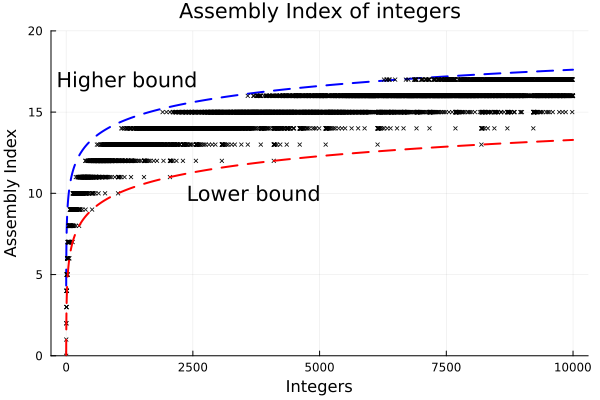

In [187]:
x = AI_df[:, :integer]
# y = log2.(20x)
y = log2(20) .+ log2.(x)
p = plot(x, y, color=:blue, linestyle=:dash, linewidth=2,
        title="Assembly Index of integers",
        xlabel="Integers", ylabel="Assembly Index", 
        ylim=(0, 20),
        legend=:none)

y = AI_df[:, :assemblyindex]
scatter!(x, y, markersize=2, marker=:x, color=:black)

y = log2.(x)
plot!(x, y, color=:red, linestyle=:dash, linewidth=2)

annotate!(3700, 10, "Lower bound")
annotate!(1200, 17, "Higher bound")

display(p)

# Plot of $\mu_i(D)$

In [197]:
using CSV, DataFrames

nreact = 9

timeseries_df = CSV.read("./data/sims/000100/timeseries.csv", DataFrame)
t500_df = filter(row -> row[:time] == 500, timeseries_df)
# display(t500_df)

int_avg_arr = []

for i in 1:nreact
    react_df = filter(row -> row[:reactor] == i, t500_df)
    
    int_avg = 0
    for row in eachrow(react_df)
        int_avg += row.variable * row.value
    end
    int_avg = int_avg / sum(react_df.value)

    push!(int_avg_arr, int_avg)
end

println(int_avg_arr)

Any[13.591068301225919, 15.94083969465649, 9.008676789587852, 17.508982035928145, 17.479666319082376, 16.87231968810916, 8.457609805924413, 15.92360430950049, 27.857522123893805]


In [198]:
dijkstra_result = dijkstra_shortest_paths(graph, 1)

dist = []
for i in 1:9
    shortest_distance = dijkstra_result.dists[i]
    push!(dist, shortest_distance)
end

println(dist)

Any[0, 1, 2, 1, 2, 3, 2, 3, 4]


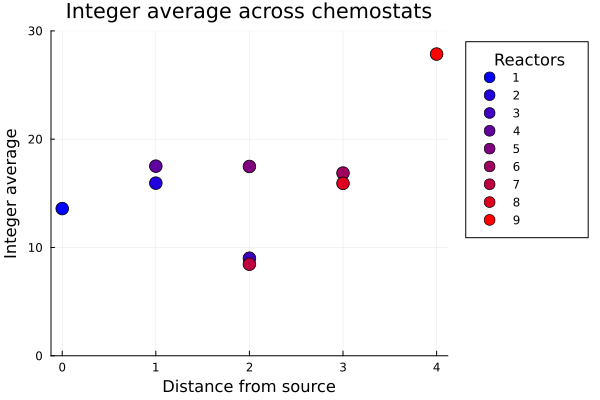

In [341]:
using Plots

s = scatter(title="Integer average across chemostats", legendtitle="Reactors", legend=:outertopright)
linear_blue_to_red = cgrad([:blue, :red], scale=:linear)

for i in 1:9
    scatter!(s, [dist[i]], [int_avg_arr[i]], marker_z=i, color=linear_blue_to_red, colorbar=false,
    xlabel="Distance from source", ylabel="Integer average", label="$i", markersize=7, ylim=(0,30))
end

display(s)

# Plot of $AI(D)$

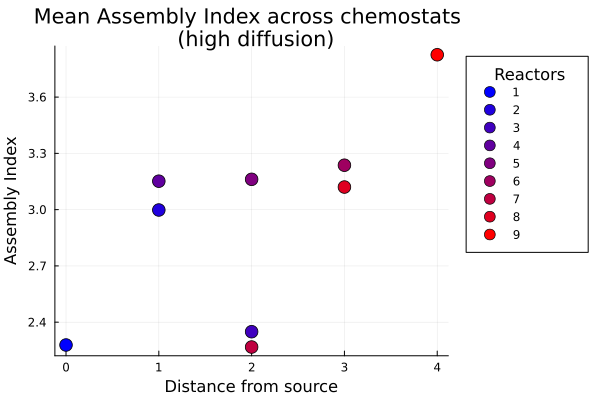

Any[2.2784588441331, 2.9980916030534353, 2.349240780911063, 3.151696606786427, 3.16162669447341, 3.236842105263158, 2.267620020429009, 3.120470127326151, 3.825663716814159]
Any[0, 1, 2, 1, 2, 3, 2, 3, 4]


In [210]:
using CSV, DataFrames

nreact = 9

timeseries_df = CSV.read("./data/sims/000100/timeseries.csv", DataFrame)
t500_df = filter(row -> row[:time] == 500, timeseries_df)
# display(t500_df)

AI_avg_arr = []

for i in 1:nreact
    react_df = filter(row -> row[:reactor] == i, t500_df)
    
    AI_avg = 0
    for ts_row in eachrow(react_df)
        ###################
        # replace variable by AI
        filtered_AI_df = filter(row -> row.integer == ts_row.variable, AI_df)
        ts_row.variable = filtered_AI_df[1, :assemblyindex]
        ###################
        AI_avg += ts_row.variable * ts_row.value
    end
    AI_avg = AI_avg / sum(react_df.value)

    push!(AI_avg_arr, AI_avg)
end

println(AI_avg_arr)

dijkstra_result = dijkstra_shortest_paths(graph, 1)

dist = []
for i in 1:9
    shortest_distance = dijkstra_result.dists[i]
    push!(dist, shortest_distance)
end

println(dist)

using Plots

s = scatter(title="Mean Assembly Index across chemostats \n (high diffusion)", legendtitle="Reactors", legend=:outertopright)
linear_blue_to_red = cgrad([:blue, :red], scale=:linear)

for i in 1:9
    scatter!(s, [dist[i]], [AI_avg_arr[i]], marker_z=i, color=linear_blue_to_red, colorbar=false,
    xlabel="Distance from source", ylabel="Assembly Index", label="$i", markersize=7)
end

display(s)

# Plot of $\mu_I(D)$ for three diffusion regimes

can’t calculate the AI as we have integers > 10000

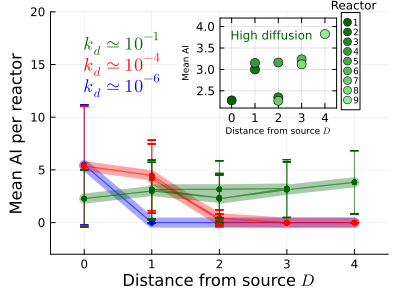

"/Users/alexandre/Documents/academic/3-research/projects/2023 spatial-topology/flow-complexity/milestones/03_AI-vs-C/plots/AI-vs-D.pdf"

In [535]:
using CSV, DataFrames, Plots, LaTeXStrings

fn_arr = ["000001", "000050", "000100"]
colors1 = [:blue, :red, :darkgreen]
colors2 = cgrad([:darkgreen, :lightgreen])

title = "Mean Integer across chemostats \n for three diffusion regimes"
s3 = scatter(size=(400,300), legendtitle="Reactors", legend=:none, xlim=(-0.5, 4.5), ylim=(-3,20)) #, xlim=(-0.25,4.5), ylim=(8e-1, 8e0))

for f in 1:3

    fn = fn_arr[f]

    nreact = 9

    timeseries_df = CSV.read("./data/sims/$fn/timeseries.csv", DataFrame)
    t500_df = filter(row -> row[:time] == 500, timeseries_df)
    # display(t500_df)
    
    mu_avg_arr = []
    sig_avg_arr = []
    
    for i in 1:nreact
        react_df = filter(row -> row[:reactor] == i, t500_df)
        
        mu_avg = 0
        sig_avg = 0
        mu_var = []
        mu_val = []
        for ts_row in eachrow(react_df)
            ###################
            # replace variable by AI
            if ts_row.variable > 9999
                int_skip = ts_row.variable
                freq_skip = filtered_AI_df[1, :assemblyindex]
                println("capping integer $int_skip with frequency $freq_skip")
                # println(ts_row.variable)
                # println(filtered_AI_df)
                ts_row.variable = 9999
            end
            filtered_AI_df = filter(row -> row.integer == ts_row.variable, AI_df)
            ts_row.variable = filtered_AI_df[1, :assemblyindex]
            ###################
            # mu_avg += ts_row.variable * ts_row.value
            push!(mu_var, ts_row.variable)
            push!(mu_val, ts_row.value)
        end
        # mu_avg = mu_avg / sum(react_df.value)

        if length(mu_var) > 0
            println("mu_var = $mu_var")
            println("mu_val = $mu_val")
            weighted_sum = sum(mu_var .* mu_val)
            total_occurrences = sum(mu_val)
            mean = weighted_sum / total_occurrences
            mu_avg = mean

            squared_deviations = (mu_var .- mean) .^ 2
            weighted_squared_deviations = squared_deviations .* mu_val
            variance = sum(weighted_squared_deviations) / total_occurrences
            standard_deviation = sqrt(variance)
            sig_avg = standard_deviation
        else
            mu_avg = 0
            sig_avg = 0
        end

        # this_d = dist[i]
        # println("reactor $i with D=$this_d has mean $mu_avg")
        push!(mu_avg_arr, mu_avg)
        push!(sig_avg_arr, sig_avg)
    end
    
    println(mu_avg_arr)
    
    dijkstra_result = dijkstra_shortest_paths(graph, 1)
    
    dist = []
    for i in 1:9
        shortest_distance = dijkstra_result.dists[i]
        push!(dist, shortest_distance)
    end
    
    println(dist)
    
    using Plots
    
    linear_blue_to_red = cgrad([:blue, :red], scale=:linear)
    
    for i in 1:9
        # scatter!(s3, [dist[i]], [mu_avg_arr[i]], color=colors[f], colorbar=false,
        # xlabel="Distance from source", ylabel="Integer Mean " * L"\mu_I", label="$i", marker=:x, markerstrokewidth=5, markersize=7)

        # add a big fat line so we can see the curves properly
        plot!(s3, dist, mu_avg_arr, color=colors1[f], markerstrokecolor=colors1[f], colorbar=false, label="$i",  lw=10, msw=1, linealpha=0.05,
        xlabel="Distance from source " * L"D", ylabel="Mean AI per reactor")

        # add the error bars with a thinner line
        plot!(s3, dist, mu_avg_arr, yerr = sig_avg_arr, color=colors1[f], markerstrokecolor=colors1[f], colorbar=false, lw=1, linealpha=0.1, markerstrokewidth=1)

        # add markers with a size in-between
        scatter!(s3, dist, mu_avg_arr, color=colors1[f], markerstrokecolor=colors1[f], colorbar=false, markersize=3)

        # lower_bound = mu_avg_arr - sig_avg_arr
        # upper_bound = mu_avg_arr + sig_avg_arr
        # plot!(s3, dist, upper_bound, fillrange=lower_bound, linealpha=0, fillalpha=0.1, color=colors1[f], label=:none, linewidth=0)
    end

end

# annotate!(4, 8, text("Low diffusion", color=:blue, :right))
# annotate!(4, 4, text("Intermediate diffusion", color=:red, :right))
# annotate!(4, 2, text("High diffusion", color=:green, :right))

annotate!(0, 13, text(L"k_d \simeq 10^{-6}", 12, color=:blue, :left))
annotate!(0, 15, text(L"k_d \simeq 10^{-4}", 12, color=:red, :left))
annotate!(0, 17, text(L"k_d \simeq 10^{-1}", 12, color=:darkgreen, :left))

x_range = -1:0.01:5
y_min = 5
y_max = 50
# plot!(x_range, fill(y_min, length(x_range)), fillrange=fill(y_max, length(x_range)), fillcolor=:lightgray, fillalpha=0.25, linecolor=:transparent)

# display(s3)

plot!(s3, legend=:outerright,  xlim=(-0.5,4.5), ylim=(2.1, 4.2),
frame=:box, inset=bbox(0.55,0.64,0.35, 0.30, :bottom, :left), subplot=2)

for i in 1:9
    scatter!(s3[2], [dist[i]], [AI_avg_arr[i]], marker_z=i, color=colors2, colorbar=false,
    xlabel="Distance from source " * L"D", ylabel="Mean AI", label="$i", markersize=5, legendfontsize=6, guidefontsize=6)
end

annotate!(s3[2], 0, 3.8, text("High diffusion", 8, color=:darkgreen, :left))
annotate!(s3[2], 4.3, 4.50, text("Reactor", :left, 8, color=:black))

display(s3)

mkpath("./plots")
savefig("./plots/AI-vs-D.pdf")

In [326]:
vals = exp10.(LinRange(-6,-1,100))
println(vals[1])
println(vals[50])
println(vals[100])

1.0e-6
0.0002983647240283343
0.1


# Plot of $\mu_I(C)$ for one simulation

In [202]:
deg = degree(graph)

9-element Vector{Int64}:
 2
 3
 2
 3
 4
 3
 2
 3
 2

In [ ]:
using Plots

s = scatter(title="Integer average across chemostats", legendtitle="Reactors", legend=:outertopright)
linear_blue_to_red = cgrad([:blue, :red], scale=:linear)

for i in 1:9
    scatter!(s, [deg[i]], [int_avg_arr[i]], marker_z=i, color=linear_blue_to_red, colorbar=false,
    xlabel="Degree centrality", ylabel="Integer average", label="$i", markersize=7, ylim=(0,30))
end

display(s)

# Plot of $\mu_I(C)$ for three diffusion regimes

Any[805.3343407631281, 1.0, NaN, 1.0, NaN, NaN, NaN, NaN, NaN]
Any[0, 1, 2, 1, 2, 3, 2, 3, 4]
Any[760.8730754787833, 49.36950146627566, 1.2731854838709677, 41.71275559883155, 1.5045871559633028, 1.0, 1.047713717693837, 1.0, 1.0]
Any[0, 1, 2, 1, 2, 3, 2, 3, 4]
Any[13.591068301225919, 15.94083969465649, 9.008676789587852, 17.508982035928145, 17.479666319082376, 16.87231968810916, 8.457609805924413, 15.92360430950049, 27.857522123893805]
Any[0, 1, 2, 1, 2, 3, 2, 3, 4]


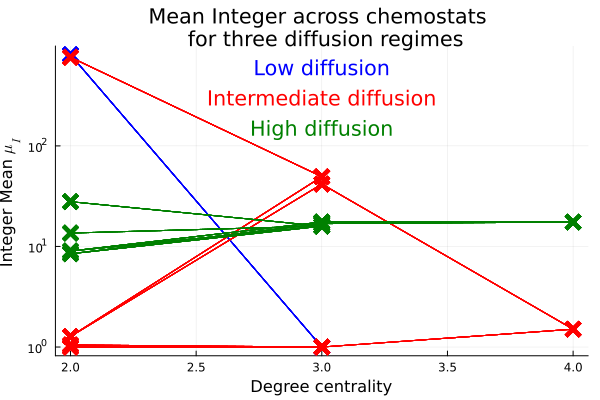

In [204]:
using CSV, DataFrames, Plots, LaTeXStrings

fn_arr = ["000001", "000050", "000100"]
colors = [:blue, :red, :green]

s = scatter(title="Mean Integer across chemostats \n for three diffusion regimes", legendtitle="Reactors", legend=:none, yscale=:log)

for f in 1:3

    fn = fn_arr[f]

    nreact = 9

    timeseries_df = CSV.read("./data/sims/$fn/timeseries.csv", DataFrame)
    t500_df = filter(row -> row[:time] == 500, timeseries_df)
    # display(t500_df)
    
    mu_avg_arr = []
    
    for i in 1:nreact
        react_df = filter(row -> row[:reactor] == i, t500_df)
        
        mu_avg = 0
        for ts_row in eachrow(react_df)
            ###################
            # replace variable by AI
            # filtered_AI_df = filter(row -> row.integer == ts_row.variable, AI_df)
            # println(ts_row.variable)
            # println(filtered_AI_df)
            # ts_row.variable = filtered_AI_df[1, :assemblyindex]
            ###################
            mu_avg += ts_row.variable * ts_row.value
        end
        mu_avg = mu_avg / sum(react_df.value)
    
        push!(mu_avg_arr, mu_avg)
    end
    
    println(mu_avg_arr)
    
    dijkstra_result = dijkstra_shortest_paths(graph, 1)
    
    dist = []
    for i in 1:9
        shortest_distance = dijkstra_result.dists[i]
        push!(dist, shortest_distance)
    end
    
    println(dist)
    
    using Plots
    
    linear_blue_to_red = cgrad([:blue, :red], scale=:linear)
    
    for i in 1:9
        # scatter!(s, [dist[i]], [mu_avg_arr[i]], color=colors[f], colorbar=false,
        # xlabel="Distance from source", ylabel="Integer Mean " * L"\mu_I", label="$i", marker=:x, markerstrokewidth=5, markersize=7)
        plot!(s, deg, mu_avg_arr, color=colors[f], colorbar=false,
        xlabel="Degree centrality", ylabel="Integer Mean " * L"\mu_I", label="$i", marker=:x, markerstrokewidth=5, markersize=7)
    end

end

annotate!(3, 600, text("Low diffusion", color=:blue))
annotate!(3, 300, text("Intermediate diffusion", color=:red))
annotate!(3, 150, text("High diffusion", color=:green))

display(s)

# Plot of $AI(C)$

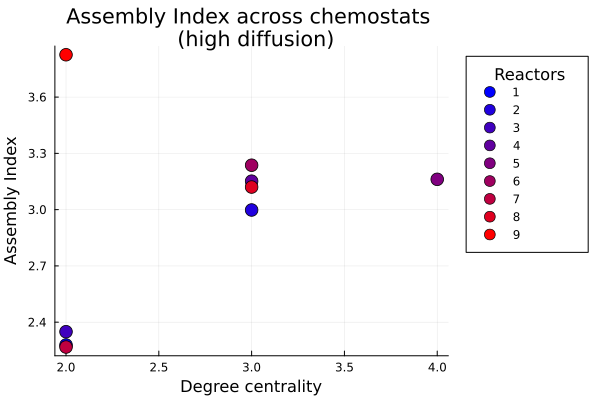

In [206]:
using Plots

s = scatter(title="Assembly Index across chemostats \n (high diffusion)", legendtitle="Reactors", legend=:outertopright)
linear_blue_to_red = cgrad([:blue, :red], scale=:linear)

for i in 1:9
    scatter!(s, [deg[i]], [AI_avg_arr[i]], marker_z=i, color=linear_blue_to_red, colorbar=false,
    xlabel="Degree centrality", ylabel="Assembly Index", label="$i", markersize=7)
end

display(s)

# 3d plot

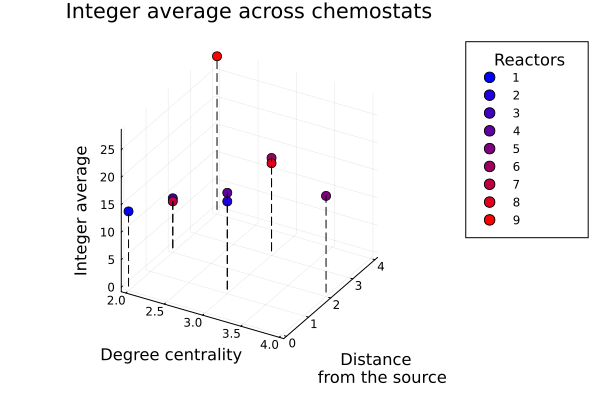

In [58]:
using Plots

s3 = scatter3d(title="Integer average across chemostats", legendtitle="Reactors", legend=:outertopright)
linear_blue_to_red = cgrad([:blue, :red], scale=:linear)

x = deg
y = dist
z = int_avg_arr

for i in 1:9
    scatter3d!(s3, [x[i]], [y[i]], [z[i]], marker_z=i, color=linear_blue_to_red, colorbar=false,
    xlabel="Degree centrality", ylabel="Distance \n from the source", zlabel="Integer average", label="$i", markersize=5)
end

# Add vertical lines
for i in 1:length(x)
    plot!([x[i], x[i]], [y[i], y[i]], [0, z[i]], label="", color=:black, linestyle=:dash)
end

display(s3)

# playground below

In [ ]:
using Plots

# Create the scatter plot
s3 = scatter3d(title="Integer average across chemostats", legendtitle="Reactors", legend=:outertopright, size=(600, 400))
linear_blue_to_red = cgrad([:blue, :red], scale=:linear)

# Sample data
x = deg
y = dist
z = int_avg_arr

# Plot the scatter points
for i in 1:9
    scatter3d!(s3, [x[i]], [y[i]], [z[i]], marker_z=i, color=linear_blue_to_red, colorbar=false,
    xlabel="Degree centrality", ylabel="Distance\nfrom the source", zlabel="Integer average", label="$i", markersize=3)
end

# Add vertical lines
for i in 1:length(x)
    plot!([x[i], x[i]], [y[i], y[i]], [0, z[i]], label="", color=:black, linestyle=:dash)
end

# Display the plot
display(s3)